In [48]:
import stlearn as st
import scanpy as sc
import numpy as np

In [49]:
st.settings.set_figure_params(dpi=150)
import pickle

# load files 
block5 = st.Read10X("/media/ema/PortableSSD/stAMD/Ulrike_GEX_reorient_078_A1/outs/")
block6 = st.Read10X("/media/ema/PortableSSD/stAMD/Ulrike_GEX_reorient_078_B1/outs/")
block7 = st.Read10X("/media/ema/PortableSSD/stAMD/Ulrike_GEX_reorient_078_C1/outs/")
block8 = st.Read10X("/media/ema/PortableSSD/stAMD/Ulrike_GEX_reorient_078_D1/outs/")
block1 = st.Read10X("/media/ema/PortableSSD/stAMD/Ulrike_GEX_reorient_079_A1/outs/")
block2 = st.Read10X("/media/ema/PortableSSD/stAMD/Ulrike_GEX_reorient_079_B1/outs/")
block3 = st.Read10X("/media/ema/PortableSSD/stAMD/Ulrike_GEX_reorient_079_C1/outs/")
block4 = st.Read10X("/media/ema/PortableSSD/stAMD/Ulrike_GEX_reorient_079_D1/outs/")

/home/ema/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/ema/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/ema/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/ema/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/ema/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_u

In [50]:
blocks = [block1, block2, block3, block4, block5, block6 ,block7, block8]

In [51]:

def filter(blo):
    mito_genes = blo.var_names.str.startswith('mt-')
    blo.obs['percent_mt2'] = np.sum(
        blo[:, mito_genes].X, axis=1).A1 / np.sum(blo.X, axis=1).A1
    blo.obs['n_counts'] = blo.X.sum(axis=1).A1
    blo = blo[blo.obs['percent_mt2'] < 0.3, ]
    sc.pp.filter_genes(blo, min_cells=5)
    sc.pp.filter_cells(blo, min_genes=500)
    return blo



def image_preprocess(blo):
    st.pp.normalize_total(blo)
    st.pp.log1p(blo)
    st.pp.tiling(blo, TILE_PATH)
    st.pp.extract_feature(blo)
    #
    return blo

# concat
from pathlib import Path
TILE_PATH = Path("/tmp/tiles")
TILE_PATH.mkdir(parents=True, exist_ok=True)


In [52]:
for i in range(8):
    blocks[i] = filter(blocks[i])
    blocks[i] = image_preprocess(blocks[i] )
    #st.spatial.SME.SME_normalize(blo, use_data="raw")


/home/ema/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|████████████████████████████████████████ [ time left: 00:00 ]
Extract feature:  17%|██████▍                               [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  21%|███████▊                              [ time left: 00:17 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  24%|████████▉                             [ time left: 00:18 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  28%|██████████▎                           [ time left: 00:17 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  31%|███████████▍                          [ time left: 00:15 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  34%|████████████▊                         [ time left: 00:14 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  38%|█████████████▉                        [ time left: 00:14 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  41%|███████████████▎                      [ time left: 00:13 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  44%|████████████████▍                     [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  48%|█████████████████▊                    [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  51%|██████████████████▉                   [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  55%|████████████████████▎                 [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  58%|█████████████████████▍                [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  62%|██████████████████████▊               [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  65%|███████████████████████▉              [ time left: 00:07 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  68%|█████████████████████████▎            [ time left: 00:07 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  71%|██████████████████████████▍           [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  75%|███████████████████████████▊          [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  78%|████████████████████████████▉         [ time left: 00:04 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  82%|██████████████████████████████▎       [ time left: 00:04 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  85%|███████████████████████████████▌      [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  89%|████████████████████████████████▊     [ time left: 00:02 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  92%|██████████████████████████████████    [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  95%|███████████████████████████████████▎  [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  99%|████████████████████████████████████▌ [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

The morphology feature is added to adata.obsm['X_morphology']!
Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|████████████████████████████████████████ [ time left: 00:00 ]
Extract feature:  19%|███████                               [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  20%|███████▎                              [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newf

Extract feature:  23%|████████▋                             [ time left: 00:14 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  27%|██████████▏                           [ time left: 00:14 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  31%|███████████▍                          [ time left: 00:13 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  35%|████████████▉                         [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  39%|██████████████▌                       [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  43%|███████████████▊                      [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  47%|█████████████████▎                    [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  50%|██████████████████▋                   [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  55%|████████████████████▏                 [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  58%|█████████████████████▍                [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  62%|██████████████████████▉               [ time left: 00:07 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  66%|████████████████████████▎             [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  70%|█████████████████████████▊            [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  73%|███████████████████████████▏          [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  77%|████████████████████████████▋         [ time left: 00:04 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  81%|█████████████████████████████▉        [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  85%|███████████████████████████████▍      [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  89%|████████████████████████████████▊     [ time left: 00:02 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  93%|██████████████████████████████████▎   [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  96%|███████████████████████████████████▌  [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature: 100%|█████████████████████████████████████ [ time left: 00:00 ]
/home/ema/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


The morphology feature is added to adata.obsm['X_morphology']!
Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|████████████████████████████████████████ [ time left: 00:00 ]
Extract feature:  20%|███████▌                              [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  21%|███████▉                              [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newf

Extract feature:  26%|█████████▍                            [ time left: 00:14 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  30%|███████████                           [ time left: 00:13 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  34%|████████████▌                         [ time left: 00:13 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  38%|██████████████▏                       [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  42%|███████████████▌                      [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  47%|█████████████████▏                    [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  50%|██████████████████▌                   [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  55%|████████████████████▎                 [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  59%|█████████████████████▋                [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  63%|███████████████████████▎              [ time left: 00:07 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  67%|████████████████████████▋             [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  71%|██████████████████████████▎           [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  75%|███████████████████████████▊          [ time left: 00:04 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  79%|█████████████████████████████▍        [ time left: 00:04 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  83%|██████████████████████████████▊       [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  88%|████████████████████████████████▍     [ time left: 00:02 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  92%|█████████████████████████████████▊    [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  96%|███████████████████████████████████▌  [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature: 100%|████████████████████████████████████▉ [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature: 100%|█████████████████████████████████████ [ time left: 00:00 ]
/home/ema/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


The morphology feature is added to adata.obsm['X_morphology']!
Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|████████████████████████████████████████ [ time left: 00:00 ]
Extract feature:  19%|███████▏                              [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  20%|███████▌                              [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newf

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  24%|████████▉                             [ time left: 00:13 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  28%|██████████▎                           [ time left: 00:14 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  32%|███████████▊                          [ time left: 00:13 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  36%|█████████████▏                        [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  40%|██████████████▋                       [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  43%|████████████████                      [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  48%|█████████████████▌                    [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  51%|██████████████████▉                   [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  55%|████████████████████▌                 [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  59%|█████████████████████▊                [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  63%|███████████████████████▍              [ time left: 00:07 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  67%|████████████████████████▋             [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  71%|██████████████████████████▎           [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  75%|███████████████████████████▋          [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  79%|█████████████████████████████▏        [ time left: 00:04 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  83%|██████████████████████████████▌       [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  87%|████████████████████████████████      [ time left: 00:02 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  90%|█████████████████████████████████▍    [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  95%|██████████████████████████████████▉   [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  98%|████████████████████████████████████▎ [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

The morphology feature is added to adata.obsm['X_morphology']!
Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|████████████████████████████████████████ [ time left: 00:00 ]
Extract feature:  22%|████████▏                             [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  23%|███████

Extract feature:  27%|██████████                            [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  32%|███████████▊                          [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  36%|█████████████▎                        [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  41%|███████████████                       [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  46%|████████████████▊                     [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  50%|██████████████████▎                   [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  54%|████████████████████▏                 [ time left: 00:07 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  59%|█████████████████████▉                [ time left: 00:07 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  63%|███████████████████████▍              [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  68%|█████████████████████████▏            [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  72%|██████████████████████████▋           [ time left: 00:04 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  77%|████████████████████████████▍         [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  82%|██████████████████████████████▏       [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  86%|███████████████████████████████▋      [ time left: 00:02 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  90%|█████████████████████████████████▍    [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  95%|██████████████████████████████████▉   [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  99%|████████████████████████████████████▋ [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

The morphology feature is added to adata.obsm['X_morphology']!
Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|████████████████████████████████████████ [ time left: 00:00 ]
Extract feature:  18%|██████▊                               [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  19%|███████

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  23%|████████▎                             [ time left: 00:15 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  26%|█████████▌                            [ time left: 00:15 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  30%|███████████                           [ time left: 00:14 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  33%|████████████▎                         [ time left: 00:13 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  37%|█████████████▊                        [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  41%|███████████████                       [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  45%|████████████████▍                     [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  48%|█████████████████▋                    [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  52%|███████████████████▏                  [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  55%|████████████████████▍                 [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  59%|█████████████████████▉                [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  63%|███████████████████████▏              [ time left: 00:07 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  67%|████████████████████████▌             [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  70%|█████████████████████████▊            [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  74%|███████████████████████████▎          [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  77%|████████████████████████████▌         [ time left: 00:04 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  81%|██████████████████████████████        [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  85%|███████████████████████████████▎      [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  89%|████████████████████████████████▊     [ time left: 00:02 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  92%|██████████████████████████████████    [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  96%|███████████████████████████████████▍  [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature: 100%|████████████████████████████████████▉ [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature: 100%|█████████████████████████████████████ [ time left: 00:00 ]
/home/ema/.local/lib/python3.

The morphology feature is added to adata.obsm['X_morphology']!
Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|████████████████████████████████████████ [ time left: 00:00 ]
Extract feature:  16%|█████▊                                [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  17%|██████▏

Extract feature:  20%|███████▎                              [ time left: 00:17 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  23%|████████▌                             [ time left: 00:18 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  26%|█████████▋                            [ time left: 00:17 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  29%|██████████▉                           [ time left: 00:16 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  33%|████████████▏                         [ time left: 00:15 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  36%|█████████████▎                        [ time left: 00:15 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  39%|██████████████▌                       [ time left: 00:14 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  43%|███████████████▊                      [ time left: 00:13 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  46%|████████████████▉                     [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  49%|██████████████████▏                   [ time left: 00:12 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  53%|███████████████████▍                  [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  55%|████████████████████▌                 [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  59%|█████████████████████▊                [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  62%|███████████████████████               [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  65%|████████████████████████▏             [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  69%|█████████████████████████▍            [ time left: 00:07 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  72%|██████████████████████████▋           [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  75%|███████████████████████████▊          [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  79%|█████████████████████████████         [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  82%|██████████████████████████████▏       [ time left: 00:04 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  85%|███████████████████████████████▍      [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  88%|████████████████████████████████▌     [ time left: 00:02 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  91%|█████████████████████████████████▊    [ time left: 00:02 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  94%|██████████████████████████████████▉   [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  98%|████████████████████████████████████▏ [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

The morphology feature is added to adata.obsm['X_morphology']!
Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|████████████████████████████████████████ [ time left: 00:00 ]
Extract feature:  23%|████████▎                             [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  28%|██████████▏                           [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  32%|███████████▋                          [ time left: 00:11 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  37%|█████████████▌                        [ time left: 00:10 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  41%|███████████████▎                      [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  45%|████████████████▊                     [ time left: 00:09 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  50%|██████████████████▌                   [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  54%|████████████████████                  [ time left: 00:08 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  59%|█████████████████████▉                [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  63%|███████████████████████▍              [ time left: 00:06 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  68%|█████████████████████████▏            [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  72%|██████████████████████████▋           [ time left: 00:04 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  77%|████████████████████████████▍         [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  81%|█████████████████████████████▉        [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  86%|███████████████████████████████▊      [ time left: 00:02 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  90%|█████████████████████████████████▎    [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature:  95%|███████████████████████████████████   [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

Extract feature:  99%|████████████████████████████████████▌ [ time left: 00:00 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
/home/ema/.local/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceW

The morphology feature is added to adata.obsm['X_morphology']!


/home/ema/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [66]:
adata_concat =blocks[0].concatenate(blocks[1:])

/home/ema/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [67]:
# Run dimensionality reduction
st.em.run_pca(adata_concat,n_comps=50)

#SME normalisation
adata_SME = adata_concat.copy()
st.spatial.SME.SME_normalize(adata_SME, use_data="raw")
adata_SME.X = adata_SME.obsm['raw_SME_normalized']


PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████████████████████████████████ [ time left: 00:00 ]


The data adjusted by SME is added to adata.obsm['raw_SME_normalized']


In [68]:
sc.pp.scale(adata_SME, max_value=10)
st.em.run_pca(adata_SME,n_comps=50)

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


In [69]:
# Prepare metadata and PCA
meta_data = adata_SME.obs
data_mat = adata_SME.obsm["X_pca"]

In [70]:
# Import and run harmony
import harmonypy as hm
ho = hm.run_harmony(data_mat, meta_data, "batch")

# Mapping back the result to the adata object
adata_SME.obsm["X_pca"] = ho.Z_corr.T

2022-05-10 11:48:14,192 - harmonypy - INFO - Iteration 1 of 10
2022-05-10 11:48:14,643 - harmonypy - INFO - Iteration 2 of 10
2022-05-10 11:48:15,071 - harmonypy - INFO - Iteration 3 of 10
2022-05-10 11:48:15,491 - harmonypy - INFO - Iteration 4 of 10
2022-05-10 11:48:15,909 - harmonypy - INFO - Iteration 5 of 10
2022-05-10 11:48:16,332 - harmonypy - INFO - Iteration 6 of 10
2022-05-10 11:48:16,752 - harmonypy - INFO - Converged after 6 iterations


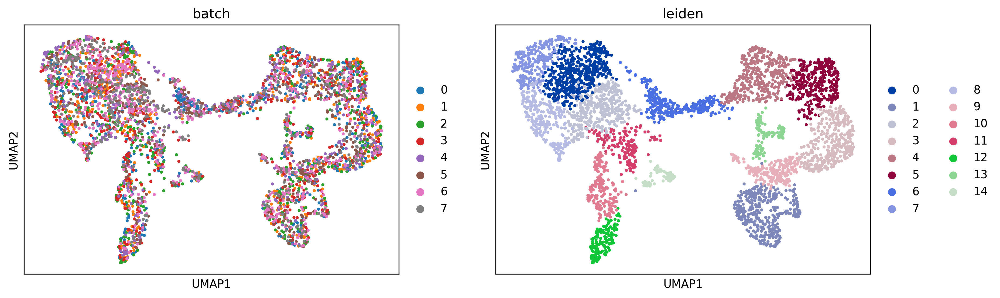

In [88]:
# Build KNN and run UMAP
sc.pp.neighbors(adata_SME, n_pcs =30)
sc.tl.umap(adata_SME)

# Run clustering with leiden
sc.tl.leiden(adata_SME, resolution=0.6)

# Plotting UMAP
sc.pl.umap(adata_SME, color=["batch","leiden"])

st.settings.set_figure_params(dpi=150)
# Map leiden clusteirng result to block A section 1



In [89]:
adata_SME.obs[adata_SME.obs.batch=="1"].louvain.values

['0', '9', '12', '0', '11', ..., '1', '5', '2', '13', '3']
Length: 510
Categories (19, object): ['0', '1', '2', '3', ..., '15', '16', '17', '18']

In [90]:
blocks[1]

AnnData object with n_obs × n_vars = 510 × 15795
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow', 'percent_mt2', 'n_counts', 'n_genes', 'tile_path', 'leiden', 'louvain'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial', 'log1p', 'leiden_colors', 'louvain_colors'
    obsm: 'spatial', 'X_tile_feature', 'X_morphology'

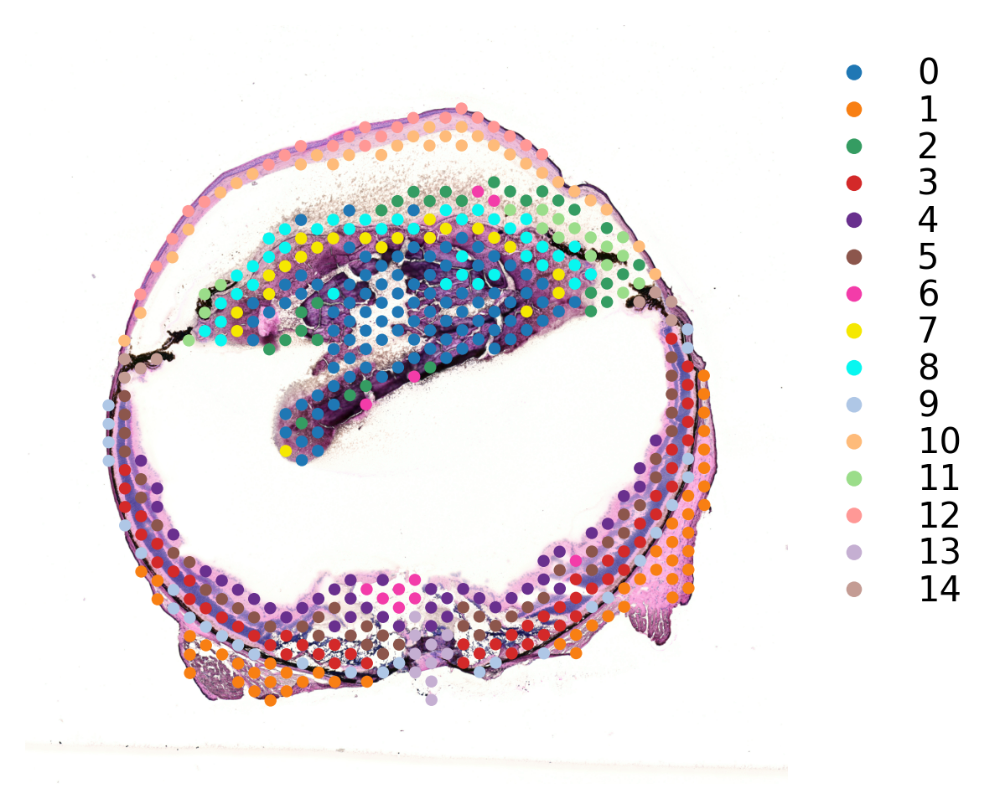

In [91]:
st.settings.set_figure_params(dpi=150)
# Map leiden clusteirng result to block A section 1
blocks[1].obs["louvain"] = adata_SME.obs[adata_SME.obs.batch=="1"].louvain.values
# Plotting the clusteirng result
st.pl.cluster_plot(blocks[1],use_label="leiden", size =12,)

In [92]:
def plot(batch):
    blo = blocks[batch]
    blo.obs["leiden"] = adata_SME.obs[adata_SME.obs.batch==str(batch)].leiden.values
    # Plotting the clusteirng result
    st.pl.cluster_plot(blo,use_label="leiden", size =12, fname = ''.join(['./SME-all/section_', str(batch), '_leiden.pdf']))


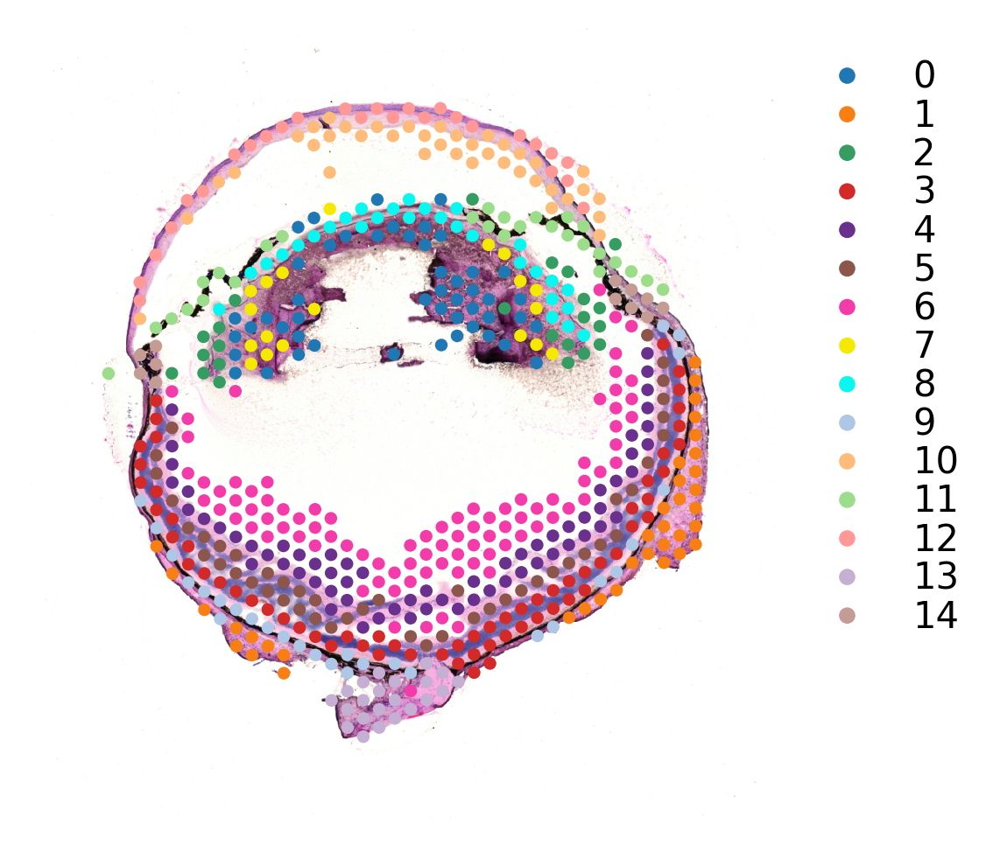

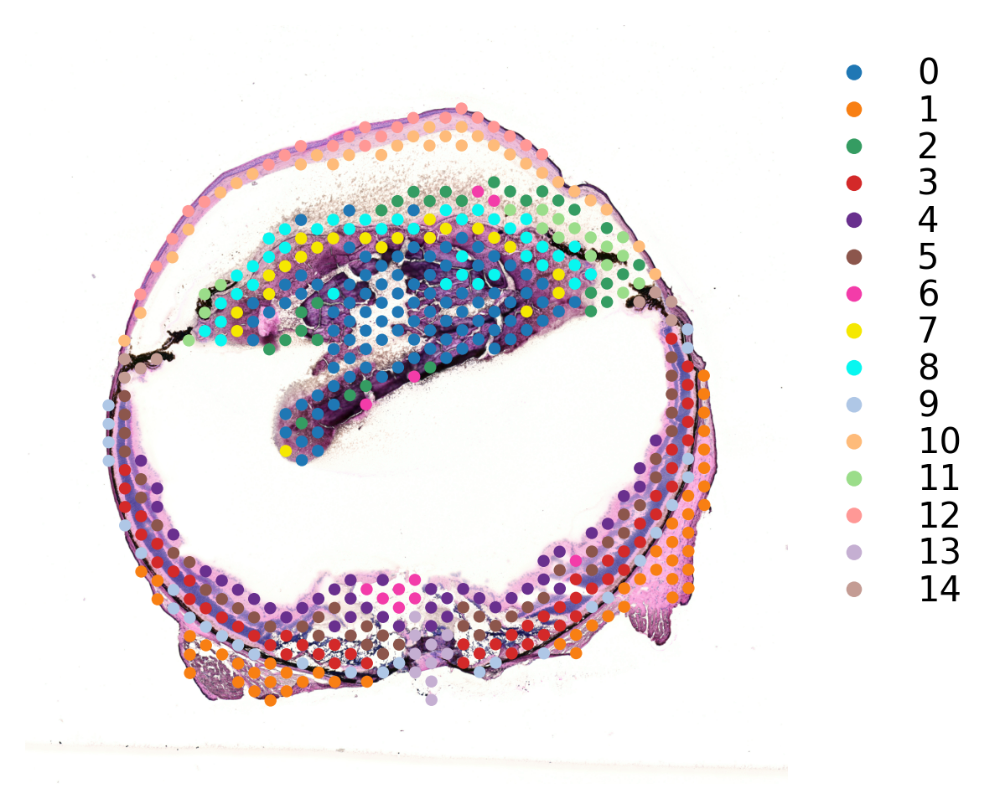

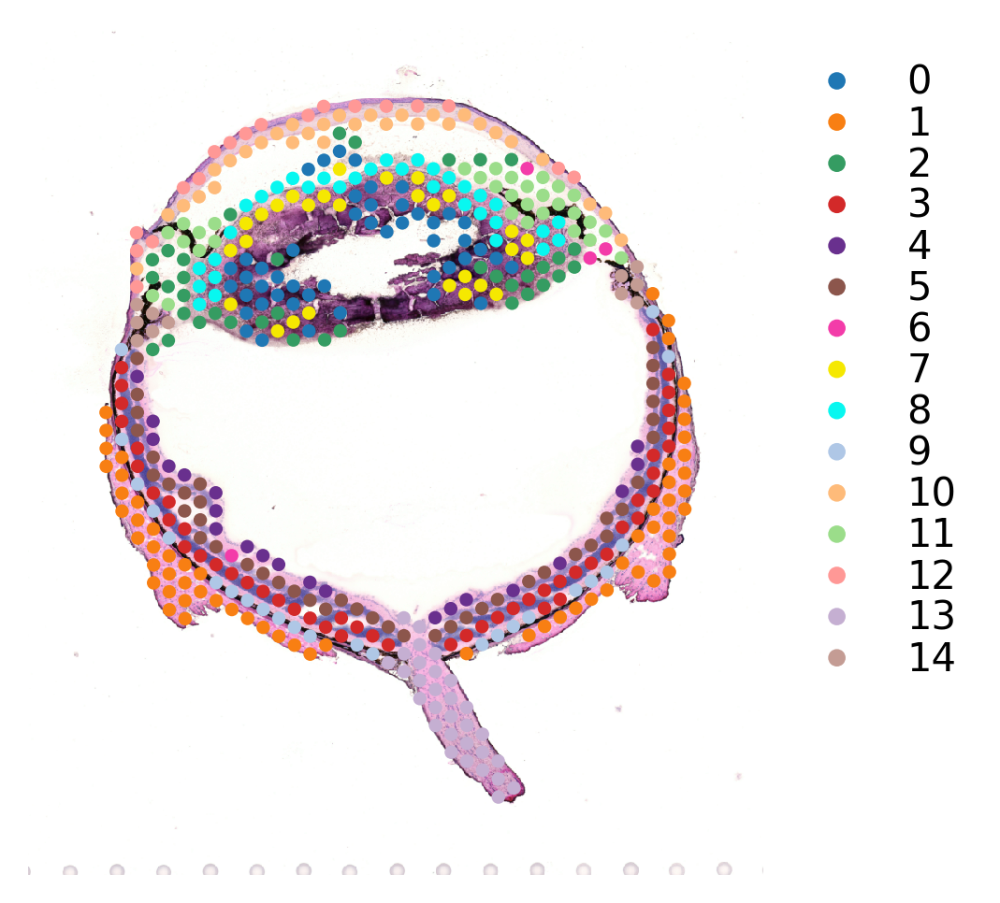

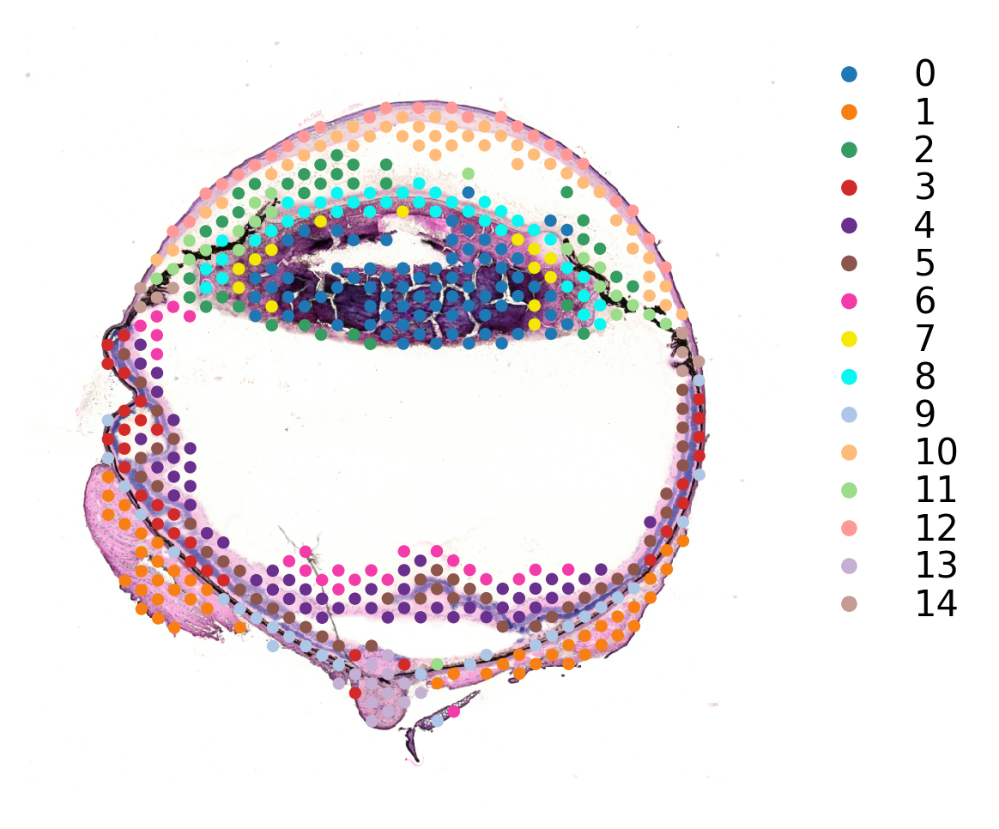

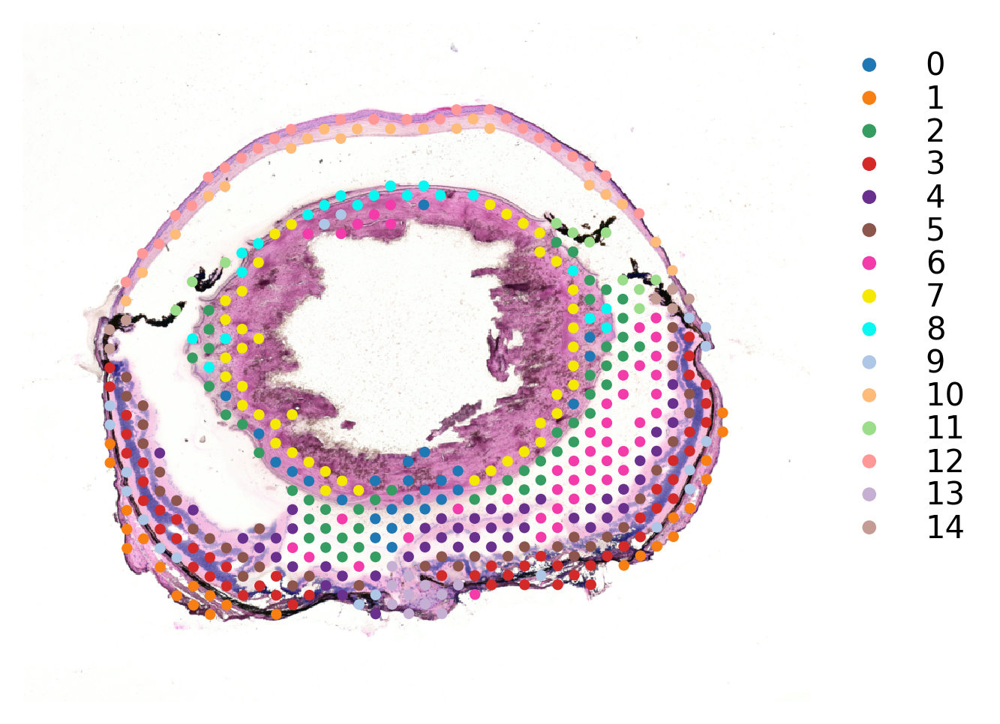

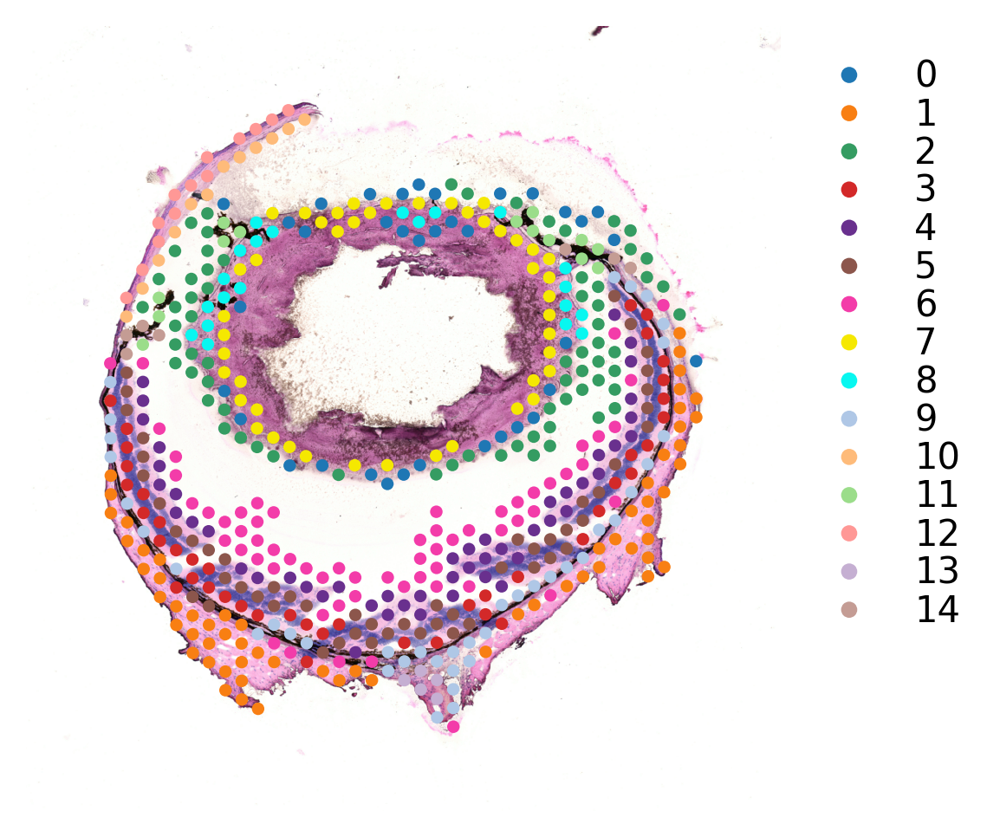

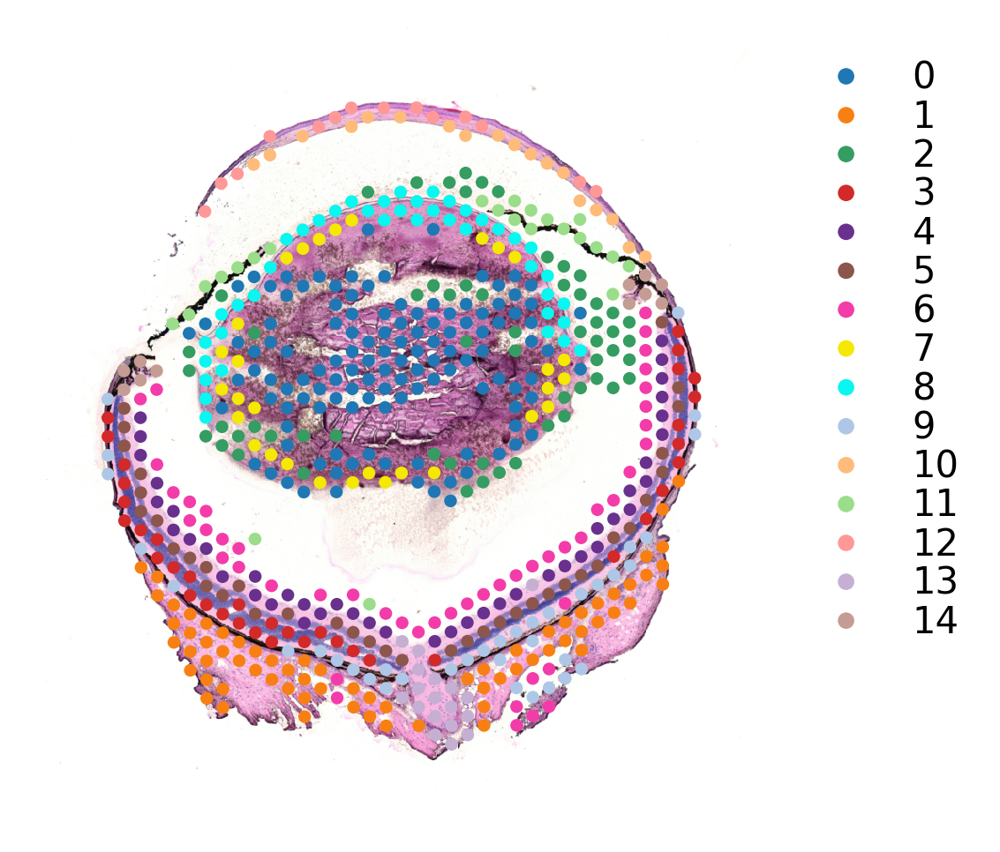

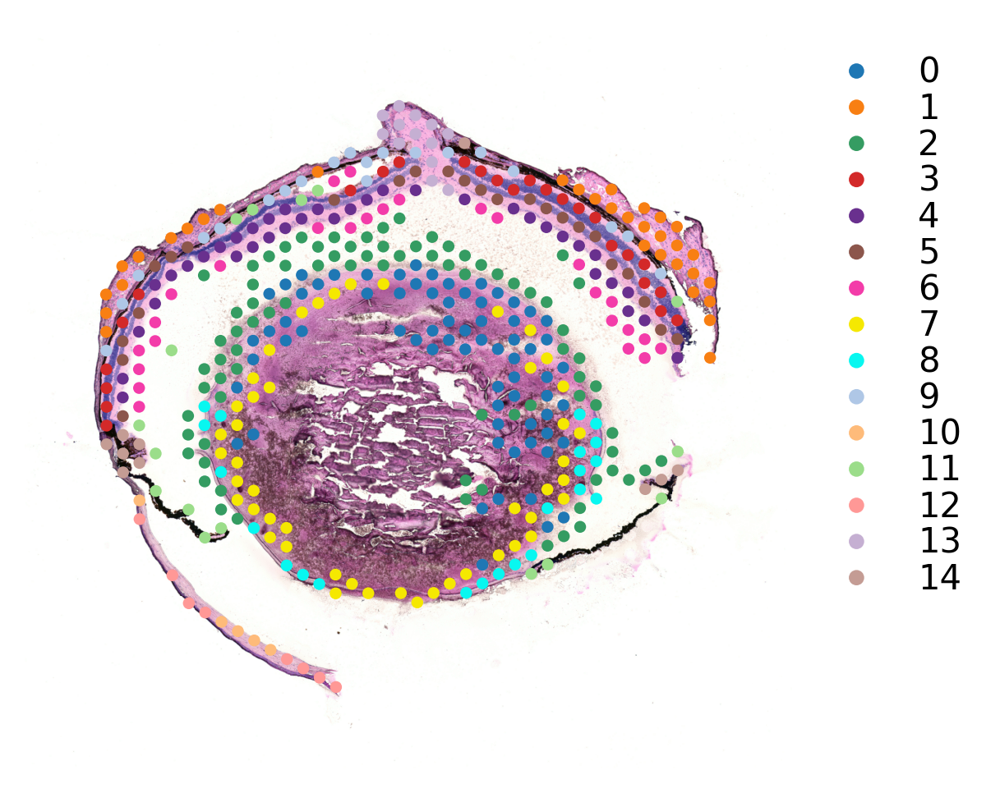

In [93]:
for i in range(8):
    plot(i)

In [94]:
adata_SME.write('SME_all_then_harmony.h5ad')

In [39]:
adata_concat.raw = blocks[0].concatenate(blocks[1:])

/home/ema/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [41]:
adata_concat.uns["iroot"] = st.spatial.trajectory.set_root(adata_concat,use_label="leiden",cluster=6,use_raw=True)
st.spatial.trajectory.pseudotime(adata_concat,eps=50,use_rep="X_pca",use_label="leiden")

/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/clustering/localization.py:45: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  subclusters = pd.Series()
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/clustering/localization.py:60: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subclusters = subclusters.append(tmp["sub_labels"])
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/clustering/localization.py:60: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subclusters = subclusters.append(tmp["sub_labels"])
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/clustering/localization.py:60: FutureWarning: The series.append method is deprecated and will 

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
All available trajectory paths are stored in adata.uns['available_paths'] with length < 4 nodes


/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/pseudotime.py:196: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  v = np.array(list(dic.values()))
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/pseudotime.py:196: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  v = np.array(list(dic.values()))


In [42]:
st.spatial.trajectory.pseudotimespace_global(adata_concat,use_label="leiden",list_clusters=["6","8"])

Screening PTS global graph...


Screening:   0%|                                                [ time left: ? ]/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
Screening:   2%|▊                                           [ time left: 00:05 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array 

/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
Screening:  35%|██████████████▉                             [ time left: 00:03 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
/home/ema/.local/lib

/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
Screening:  67%|████████████████████████████▉               [ time left: 00:01 ]/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
/home/ema/.local/lib

/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
/home/ema/.local/lib/python3.8/site-packages/stlearn/spatials/trajectory/weight_optimization.py:32: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  nx.adjacency_matrix(
Screening: 100%|███████████████████████████████████████████ [ time left: 00:00 ]


Calculate the graph dissimilarity using Laplacian matrix...


Calculating: 100%|█████████████████████████████████████████ [ time left: 00:00 ]


The optimized weighting is: 0.74
Start to construct the trajectory: 6 -> 8


In [49]:
block0 = adata_concat[adata_concat.obs['batch']==0 , ]

In [50]:
st.pl.cluster_plot(block0 ,use_label="leiden",show_trajectories=True,list_clusters=["6","8"],show_subcluster=True)

ValueError: When .uns['spatial'][library_id] does not exist, spot_size must be provided directly.

In [66]:
adata_concat.write('harmony_then_SME.h5ad')

AttributeError: 'int' object has no attribute 'encode'

Above error raised while writing key 7 of <class 'h5py._hl.group.Group'> to /

2932.334